## CZ1015 Mini Project - FS7 Team2

Objective: What's the world's happiness score like in the next 5 years?

# Data Exploration

In [152]:
# import basic packages
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()

# import plotly packages
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools
from sklearn.metrics import classification_report,precision_score,recall_score
py.init_notebook_mode(connected = False)

In [153]:
# Importing the excel as a Pandas DataFrame
rawData = pd.read_excel('./Chapter2OnlineData.xls')
regionData = pd.DataFrame(pd.read_excel('./WHR2018Chapter2OnlineData.xls', sheet_name='SupportingFactors'))
# Data Simplification
hpData = rawData.iloc[:, :9]
hpData.head()

,Country name,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,2008,3.723590,7.168690,0.450662,50.799999,0.718114,0.177889,0.881686
1,Afghanistan,2009,4.401778,7.333790,0.552308,51.200001,0.678896,0.200178,0.850035
2,Afghanistan,2010,4.758381,7.386629,0.539075,51.599998,0.600127,0.134353,0.706766
3,Afghanistan,2011,3.831719,7.415019,0.521104,51.919998,0.495901,0.172137,0.731109
4,Afghanistan,2012,3.782938,7.517126,0.520637,52.240002,0.530935,0.244273,0.775620


In [154]:
# Extract Year 2018 Data
hp2018Data = hpData[hpData["Year"] == 2018] 
hp2018Data.head()

,Country name,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
10,Afghanistan,2018,2.694303,7.494588,0.507516,52.599998,0.373536,-0.084888,0.927606
21,Albania,2018,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129
28,Algeria,2018,5.043086,9.557952,0.798651,65.900002,0.583381,-0.172413,0.758704
45,Argentina,2018,5.792797,9.809972,0.899912,68.800003,0.845895,-0.206937,0.855255
58,Armenia,2018,5.062449,9.119424,0.814449,66.900002,0.807644,-0.149109,0.676826


In [155]:
# Information about year 2018 data
hp2018Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 136 entries, 10 to 1703
Data columns (total 9 columns):
Country name                        136 non-null object
Year                                136 non-null int64
Life Ladder                         136 non-null float64
Log GDP per capita                  127 non-null float64
Social support                      136 non-null float64
Healthy life expectancy at birth    132 non-null float64
Freedom to make life choices        136 non-null float64
Generosity                          126 non-null float64
Perceptions of corruption           129 non-null float64
dtypes: float64(7), int64(1), object(1)
memory usage: 10.6+ KB


# Visualisation: World map happiness index from 2005 to 2018

In [156]:
#cleaning data to extract the data code
RegionDataSet = regionData[:]
allCountry =  hpData['Country name']
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')
countCode=[]
code = pd.DataFrame(df[['COUNTRY', 'CODE']])
code.head()

for x in allCountry:
    temp=code[(code['COUNTRY'] == x) ]
    tmp = list(temp['CODE'])
    if len(tmp) != 0:
        countCode.append(tmp[0])
    else:
        countCode.append(0)

In [157]:
#cleaning data to extract the region code
Region  = pd.DataFrame(RegionDataSet[['country', 'Region indicator']])

countRegion = []

for x in allCountry:
    tempRegion=Region[(Region['country'] == x) ]
    tmpRegion = list(tempRegion['Region indicator'])
    if len(tmpRegion) != 0:
        countRegion.append(tmpRegion[0])
    else:
        countRegion.append(0)

In [158]:
#insert country code and region data set to the main data frame
allcountryFilter = pd.DataFrame(hpData[:])
allcountryFilter.insert(1, 'code', countCode)
allcountryFilter.insert(2, 'Region', countRegion)

In [159]:
#insert country code for those country with '0' value
for i in range(len(allcountryFilter)):
        if (allcountryFilter["Country name"][i] == "Congo (Brazzaville)"):
            allcountryFilter["code"][i] = "COD"
        if (allcountryFilter["Country name"][i] == "Congo (Kinshasa)"):
            allcountryFilter["code"][i] = "COD"
        if (allcountryFilter["Country name"][i] == "Gambia"):
            allcountryFilter["code"][i] = "GMB"
        if (allcountryFilter["Country name"][i] == "Hong Kong S.A.R. of China"):
            allcountryFilter["code"][i] = "HKG"
        if (allcountryFilter["Country name"][i] == "Ivory Coast"):
            allcountryFilter["code"][i] = "CIV"   
        if (allcountryFilter["Country name"][i] == "Palestinian Territories"):
            allcountryFilter["code"][i] = "PSE" 
        if (allcountryFilter["Country name"][i] == "Somaliland region"):
            allcountryFilter["code"][i] = "SOM"    
        if (allcountryFilter["Country name"][i] == "Ivory Coast"):
            allcountryFilter["code"][i] = "CIV"
        if (allcountryFilter["Country name"][i] == "Myanmar"):
            allcountryFilter["code"][i] = "MMR"
        if (allcountryFilter["Country name"][i] == "South Korea"):
            allcountryFilter["code"][i] = "KOR"
        if (allcountryFilter["Country name"][i] == "Taiwan Province of China"):
            allcountryFilter["code"][i] = "TWN"
        if (allcountryFilter["Country name"][i] == "North Cyprus"):
            allcountryFilter["code"][i] = "CYP"

In [160]:
dataset = allcountryFilter

# Wordmap from year 2005 to 2019 
years = range(2005, 2019)

# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['title'] = 'Happiness Score (or Life Ladder) of Countries by Year'
figure['layout']['height'] = 700
figure['layout']['width'] = 1010
figure['layout']['geo'] = {
    'showland': True,
    'showcountries': True,
    'showocean': True,
    'landcolor': 'rgb(229, 229, 229)',
    'oceancolor': 'rgb(234, 234, 242)',
    'showframe': False,
    'showcoastlines': False,
    'countrywidth': 0.5,
    'projection': {'type': 'equirectangular'} 
}

figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '2005',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': True},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make FIGURE data
year = 2005
dataset_by_year = dataset[dataset['Year'] == year]

data_dict = {
    'type' : 'choropleth',
    'locations': dataset_by_year['code'],
    'z': dataset_by_year['Life Ladder'],
    'colorscale': 'RdBu',
    'marker': {
        'line': {
            'color': 'rgb(180,180,180)',
            'width': 0.5,
        },
    },
    'zmin': 2.5,
    'zmax': 8,
    'text': list(dataset_by_year['Country name']),
    'colorbar': {'title': 'Life Ladder', 'dtick': 0.5,}
}

figure['data'].append(data_dict)

# make FRAME data
for year in years:
    frame = {'data': [], 'name': str(year)}
    
    dataset_by_year = dataset[dataset['Year'] == year]
    
    data_dict = {
        'type' : 'choropleth',
        'locations': dataset_by_year['code'],
        'z': dataset_by_year['Life Ladder'],
        'colorscale': 'RdBu',
        'marker': {
            'line': {
                'color': 'rgb(180,180,180)',
                'width': 0.5
            }
        },
        'zmin': 2.5,
        'zmax': 8,
        'text': list(dataset_by_year['Country name']),
        'colorbar': {'title': 'Life Ladder', 'dtick': 0.5},
    }
    frame['data'].append(data_dict)
    
    figure['frames'].append(frame)
    
    slider_step = {
        'label': year,
        'method': 'animate',
        'args': [[year], {
                'mode': 'immediate',
                'transition': {'duration': 300},
                'frame': {'duration': 300, 'redraw': True}
            }
        ]
     
    }
    sliders_dict['steps'].append(slider_step)

figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)

## Analysis
- Over the years, the data sample for the happiness score increased
- Large part of the world (America, Europe, and Australia) is generally getting higher happiness score over the years, except for Africa
- Asia generally remains neutral, not too happy


# Visualisation: Bar chart of happiness index and its determinants breakdown of top and bottom 20 countries

In [161]:
# basic layout of life ladder
recent_sort = hp2018Data.sort_values(by='Life Ladder', ascending=False)

NUM = 20
trace1 = go.Bar(
    y = recent_sort[:NUM]['Country name'][::-1],
    x = recent_sort[:NUM]['Life Ladder'][::-1],
    name = 'First %d' % NUM,
    orientation = 'h',
    showlegend = True
)
trace2 = go.Bar(
    y = recent_sort[-NUM:]['Country name'][::-1],
    x = recent_sort[-NUM:]['Life Ladder'][::-1],
    name = 'Last %d' % NUM,
    orientation = 'h',
    showlegend = True
)
data = [trace2, trace1]
layout = go.Layout(
    title = 'Happiness of Each Country in 2018 (First and Last %d)' % NUM,
    legend=dict(orientation="h"),
    yaxis=dict(dtick=1), 
    height=780,
    margin=dict(
        l=120,
        r=10,
        t=80,
        b=80
    ),
)
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

In [162]:
determinants = ['Log GDP per capita', 'Social support',
        'Healthy life expectancy at birth', 'Freedom to make life choices',
        'Generosity', 'Perceptions of corruption', 'Log GDP per capita']

#standardise radar chart determinants score for every country to be out of 1
hp2018DataNoNa = hp2018Data.fillna(0)
hp2018DataNoNa.index = range(len(hp2018Data))

values = []
namesWithScore = []
#dropDownAttr = []
for i, name in hp2018DataNoNa["Country name"].items():
    a = hp2018DataNoNa[hp2018DataNoNa["Country name"] == name].iloc[:, 3:12].values
    a[0][0] = a[0][0]/hp2018DataNoNa['Log GDP per capita'].max()
    a[0][2] = a[0][2]/hp2018DataNoNa['Healthy life expectancy at birth'].max()
    b = hp2018DataNoNa[hp2018DataNoNa["Country name"] == name].iloc[:, 3].values
#     print(b)
#    print(np.append(a, b))
    values.append(a)
    
    nameStr = name + " | Score: " + str(round(hp2018DataNoNa["Life Ladder"][i], 2))
    namesWithScore.append(nameStr)
    
#     dropDownAttr.append({
#         "args": ["visible", np.asarray(hp2018DataNoNa["Country name"].isin([name]))], 
#         "label": name, 
#         "method": "restyle"
#     })

In [163]:
# Breakdown of countries' happiness score in 2018
recent_sort = hp2018Data.sort_values(by='Life Ladder', ascending=False).iloc[:,0:9]

NUM = 20
temp = recent_sort[:NUM].append(recent_sort[-NUM:])

#standardise radar chart determinants score for every country to be out of 1
temp = temp.fillna(0)

values = []
countries = []
scores = []
for i, name in temp["Country name"].items():
    t = temp[temp["Country name"] == name].iloc[:, 2:12].values
    t[0][1] = t[0][1]/hp2018Data['Log GDP per capita'].max()
    t[0][3] = t[0][3]/hp2018Data['Healthy life expectancy at birth'].max()
    t[0][6] = 1 - (t[0][6]/hp2018Data['Perceptions of corruption'].max())
    #t[0][0] = t[0][0]/10
    a = [t[0][0], t[0][1], t[0][2], t[0][3], t[0][4], t[0][5], t[0][6]] #unwrap t array
    b = temp[temp["Country name"] == name].iloc[:, 2].values
    values.append(a)
    scores.append(b)

    # nameStr = name + " | Score: " + "{0:.2f}".format(temp["Life Ladder"][i])
    namesWithScore.append(name)

scores = scores[::-1]

top_labels = ['Life<br>Ladder', 'Log GDP<br>per capita', 'Social<br>support', 'Healthy life expectancy<br>at birth', 
              'Freedom to make<br>life choices', 'Generosity', 'Perceptions of<br>corruption (Reversed)']

colors = ['rgba(127, 127, 127, 1)', 'rgba(31, 119, 180, 1)', 'rgba(255, 127, 14, 1)', 'rgba(44, 160, 44, 1)', 
          'rgba(214, 39, 40, 1)', 'rgba(148, 103, 189, 1)', 'rgba(140, 86, 75, 1)']


x_data = values[::-1]

y_data = namesWithScore[::-1]
traces = []

for i in range(0, len(x_data[0])):
    for j, (xd, yd) in enumerate(zip(x_data, y_data)):
        traces.append(go.Bar(
            x=[xd[i]],
            y=[yd],
            base=0 if (i == 0) else None,
            legendgroup=top_labels[i],
            name=top_labels[i],
            orientation='h',
            marker=dict(color=colors[i]),
            showlegend = True if (j==0) else False
        ))

layout = go.Layout(
    title = "Breakdown of Countries' Happiness Scores in 2018 (First and Last %d)" % NUM,
    xaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=False,
        zeroline=False,
        domain=[0.15, 1],
        hoverformat='0.2f'
    ),
    yaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=False,
        zeroline=False,
    ),
    barmode='stack',
    margin=dict(
        l=60,
        r=0
    ),
    showlegend=True,
    legend=dict(orientation="h"),
    width= 950,
    height=800
)

annotations = []


for yd, xd in zip(y_data, x_data):
    # labeling the y-axis
    annotations.append(dict(xref='paper', yref='y',
                            x=0.14, y=yd,
                            xanchor='right',
                            text=str(yd),
                            font=dict(family='Arial', size=12,
                                      color='rgb(67, 67, 67)'),
                            showarrow=False, align='right'))

    # labeling the first percentage of each bar (x_axis)
    if (xd[0] > 0):
        annotations.append(dict(xref='x', yref='y',
                                x=xd[0]-0.15, y=yd,
                                text=str(round(xd[0], 2)),
                                font=dict(family='Arial', size=12,
                                          color='rgb(248, 248, 255)'),
                                showarrow=False))
    space = 0
    for i in range(1, len(xd)):
            # labeling the rest of percentages for each bar (x_axis)
            if (xd[i] > 0.4):
                annotations.append(dict(xref='x', yref='y',
                                        x=space + (xd[i]/2), y=yd, 
                                        text=str(round(xd[i], 2)),
                                        font=dict(family='Arial', size=12,
                                                  color='rgb(248, 248, 255)'),
                                        showarrow=False))

            space += xd[i] 

layout['annotations'] = annotations

fig = go.Figure(data=traces, layout=layout)
py.iplot(fig, filename='bar-colorscale')

Note: The perception of corruption index is reversed, to be consistent with the remaining index.
Hence, in the above bar chart, higher is better for all indexes.

## Analysis

- Generally the happiest few countries tend to have higher faith in their government, and higher GDP
- Most countries have very low or nonexistent Generosity score

# Visualisation: Boxplots of all the 6 determinants contributing to the happiness index

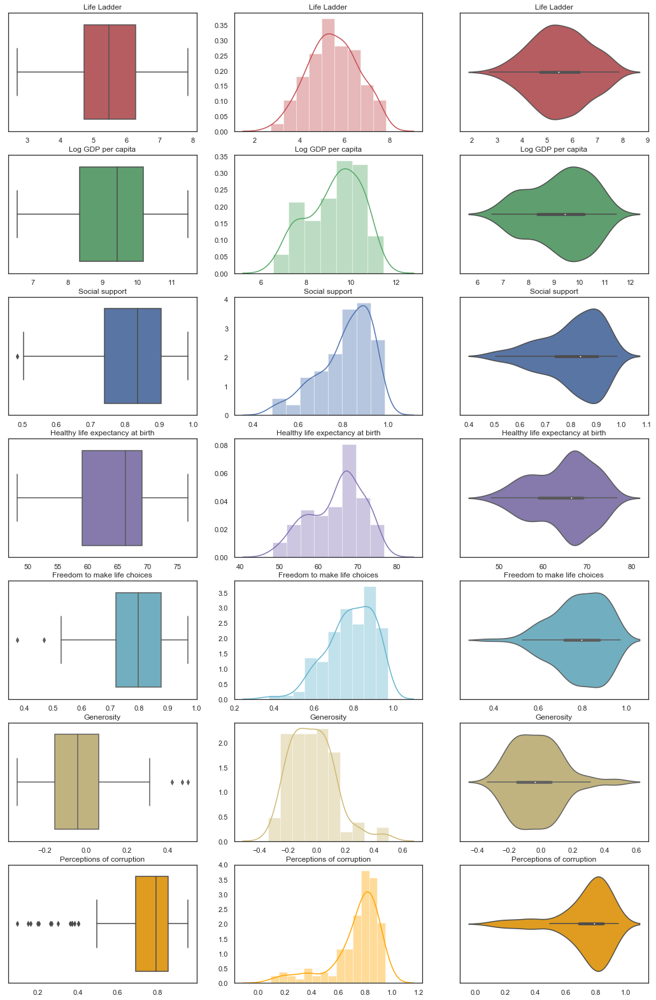

In [201]:
# Draw the distributions of all variables
# Box plot, histogram, violinplot
f, axes = plt.subplots(7, 3, figsize=(18, 28))
colors = ["r", "g", "b", "m", "c", "y", "orange"]
cols = hp2018Data.columns.drop(['Country name', 'Year'])

count = 0
for var in cols:
    varDF = pd.DataFrame(hp2018Data[var], columns=[var]).dropna()
    sb.boxplot(varDF, orient = "h", color = colors[count], ax = axes[count,0]).set_title(var)
    sb.distplot(varDF, color = colors[count], ax = axes[count,1]).set_title(var)
    sb.violinplot(varDF, color = colors[count], ax = axes[count,2]).set_title(var)
    count += 1

## Analysis
- We can see that the life ladder follows a normal distribution, which means the happiness score is quite fairly distributed through out, not too abnormal
- While the Generosity index seem to be the only one having low median score compared to the rest of the indexes

# Visualisation: Radar chart of Top 20, bottom 20, and All Countries

In [165]:
determinants = ['Country name', 'Log GDP per capita', 'Social support',
                'Healthy life expectancy at birth', 'Freedom to make life choices',
                'Generosity', 'Perceptions of corruption']

scaled_sort = recent_sort.fillna(0)
scaled_sort = scaled_sort[determinants]
# scaling 
scaled_sort['Log GDP per capita'] = scaled_sort['Log GDP per capita'].map(lambda x: x / scaled_sort['Log GDP per capita'].max())
scaled_sort['Healthy life expectancy at birth'] = scaled_sort['Healthy life expectancy at birth'].map(lambda x: x / scaled_sort['Healthy life expectancy at birth'].max())
scaled_sort.head()
del determinants[0]
determinants.append('Log GDP per capita')

In [166]:
# radar chart of 6 determinants for first 20 countries in 2018
first = scaled_sort.head(NUM)
country = first['Country name']

data = [
    go.Scatterpolar(
        r = sum(np.array(first[first['Country name'] == name]).tolist(), [])[1:],
        theta = determinants,
        fill = 'toself',
        name = name,
    ) for name in country]

layout = go.Layout(
  polar = dict(
    radialaxis = dict(
      visible = False,
      range = [-0.3, 1]
    )
  ),
  showlegend = True,
  title = "First %d Happiness Score (Life Ladder) Breakdown into 6 Determinants" % NUM,
  annotations=[
        dict(
            x=1.21,
            y=1.05,
            align="right",
            valign="top",
            text='Double-click to zoom in',
            showarrow=False,
            xref="paper",
            yref="paper",
            xanchor="center",
            yanchor="top"
        )
    ]
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename = "radar/multiple")

## Analysis
- All determinants are genrally consistent among the top 20 counties
- Except for Generosity, it varies greatly among the the countries

In [167]:
#print(determinants)
# radar chart of 6 determinants for last 20 countries in 2018
last = scaled_sort.tail(NUM)
country = last['Country name']

data = [
    go.Scatterpolar(
        r = sum(np.array(last[last['Country name'] == name]).tolist(), [])[1:],
        theta = determinants,
        fill = 'toself',
        name = name,
    ) for name in country]

layout = go.Layout(
  polar = dict(
    radialaxis = dict(
      visible = False,
      range = [-0.3, 1]
    )
  ),
  showlegend = True,
  title = "Last %d Happiness Score (Life Ladder) Breakdown into 6 Determinants" % NUM,
  annotations=[
        dict(
            x=1.21,
            y=1.05,
            align="right",
            valign="top",
            text='Double-click to zoom in',
            showarrow=False,
            xref="paper",
            yref="paper",
            xanchor="center",
            yanchor="top"
        )
    ]
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename = "radar/multiple")

## Analysis
- In contrast to the top 20 countries, the breakdown of the determinant scores for the bottom 20 countries varies greatly for all categories.
- But one thing they have in common is little faith in the government
- Despite being the bottom few countries in terms of happiness, Haiti has actually the highest Generosity index, even higher than some of the top 20 countries

In [168]:
determinants = ['Log GDP per capita', 'Social support',
        'Healthy life expectancy at birth', 'Freedom to make life choices',
        'Generosity', 'Perceptions of corruption', 'Log GDP per capita']

#standardise radar chart determinants score for every country to be out of 1
hp2018DataNoNa = hp2018Data.fillna(0)
hp2018DataNoNa.index = range(len(hp2018Data))

values = []
namesWithScore = []
#dropDownAttr = []
for i, name in hp2018DataNoNa["Country name"].items():
    a = hp2018DataNoNa[hp2018DataNoNa["Country name"] == name].iloc[:, 3:12].values
    a[0][0] = a[0][0]/hp2018DataNoNa['Log GDP per capita'].max()
    a[0][2] = a[0][2]/hp2018DataNoNa['Healthy life expectancy at birth'].max()
    b = hp2018DataNoNa[hp2018DataNoNa["Country name"] == name].iloc[:, 3].values
#     print(b)
#    print(np.append(a, b))
    values.append(a)
    
    nameStr = name + " | Score: " + str(round(hp2018DataNoNa["Life Ladder"][i], 2))
    namesWithScore.append(nameStr)
    
#     dropDownAttr.append({
#         "args": ["visible", np.asarray(hp2018DataNoNa["Country name"].isin([name]))], 
#         "label": name, 
#         "method": "restyle"
#     })

In [169]:
# fill data array with 136 countries' scatterpolar graph objects
data = []
for i, name in hp2018DataNoNa["Country name"].items():
    data.append(
        go.Scatterpolar(
            r = values[i][0],
            theta = determinants,
            fill = 'toself',
            name = namesWithScore[i]
        )
    )

# double-click legend label to isolate data instead of dropdownlist
layout = go.Layout(
    
  polar = dict(
    radialaxis = dict(
      visible = False,
      range = [-0.25, 1]
    )
  ),
  showlegend = True,
  title = "136 Countries' Happiness Score (Life Ladder) Breakdown into 6 Determinants",
  annotations=[
        dict(
            x=1.21,
            y=1.05,
            align="right",
            valign="top",
            text='Double-click country name to isolate its individual trace',
            showarrow=False,
            xref="paper",
            yref="paper",
            xanchor="center",
            yanchor="top"
        )
    ]
#   updatemenus = [
#     {
#       "x": 0.1, 
#       "y": 1.5,
#       "pad": {
#           "r": 10,
#           "t": 10
#       },
#       "type": "buttons",
#       "buttons": "dropDownAttr", 
#       "yanchor": "top"
#     }
#   ]
  
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename = "radar/multiple")

## Analysis
- As expected, the breakdown of all the determinants and the trend for all the countries look very hazardous.
- But if we compare the happiness country, Finland, and the unhappiest, Afghanistan, and the most generous, Indonesia, we can see that actually Indonesia has very even distribution of the scores, score not too bad for all the components, but did not make it to the top 20.
- So this led us to to believe that actually some factors here have higher correlation to the happiness index than the other. To confirm this, we plotted the heat map below

# Visualisaton: Heat map

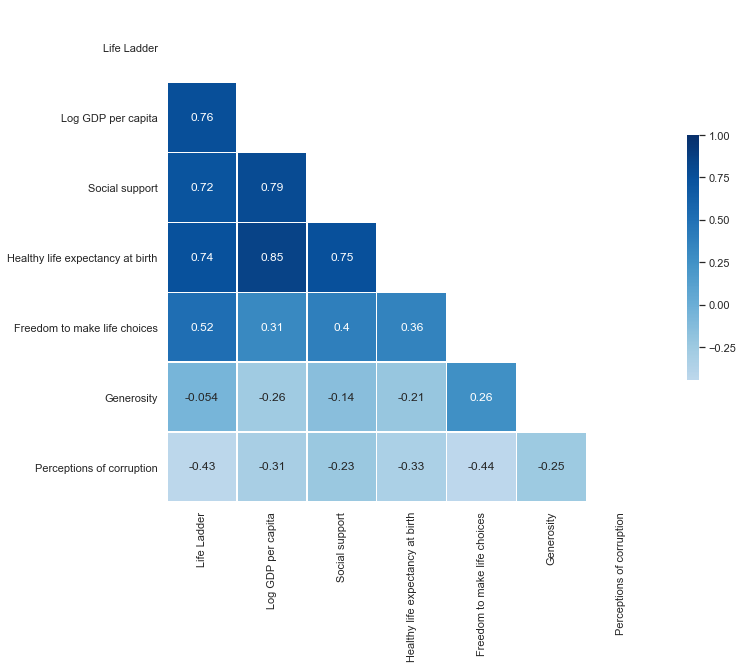

In [170]:
# # heatmap of year 2018 data
# f, axes = plt.subplots(1, 1, figsize=(16, 16))
# sb.heatmap(hp2018Data.drop(columns=['Year']).corr(), linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "BuGn")

sb.set(style="white")

corrInput = hp2018Data.iloc[:,2:9]

# Compute the correlation matrix
corr = corrInput.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))


# Draw the heatmap with the mask and correct aspect ratio
sb.heatmap(corr, mask=mask, vmax=1, center=0, annot=True, cmap="Blues",
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

## Analysis
- Indeed, some indexes like the GDP, Social Support, and life expectancy tend to have higher correlation with the happiness index (life ladder) than the other index
- Choosing the top 2 indexes with the highest correlation, the GDP and life expectancy, we then proceed on to see how those indexes changed over the years for the countries

# Visualisation: Bubble plot of the happiness index, life expectancy, and GDP

In [171]:
hpDataNoNa = hpData.fillna(0)
hpDataNoNa.index = range(len(hpData))
hpDataNoNaWithRegion = hpDataNoNa
hpDataNoNaWithRegion.insert(2, "Region indicator", "-")

for i in range(len(hpDataNoNaWithRegion)):
    for j in range(len(regionData)):
        if (hpDataNoNaWithRegion["Country name"][i] == regionData["country"][j]):
            hpDataNoNaWithRegion["Region indicator"][i] = regionData["Region indicator"][j]
            break

In [172]:
# bubble chart of life expectancy v.s. happiness from 2005 to 2018
url = 'https://raw.githubusercontent.com/plotly/datasets/master/gapminderDataFiveYear.csv'
#dataset = pd.read_csv(url)
dataset = hpDataNoNaWithRegion

years = ['2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018']
continents = regionData["Region indicator"].unique()

# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [30, 80], 'title': 'Healthy life expectancy at birth'}
figure['layout']['yaxis'] = {'title': 'Happiness Score'}
figure['layout']['hovermode'] = 'closest'
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '2005',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}
figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
year = 2005
for continent in continents:
    dataset_by_year = dataset[dataset['Year'] == year]
    dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Region indicator'] == continent]

    data_dict = {
        'x': list(dataset_by_year_and_cont['Healthy life expectancy at birth']),
        'y': list(dataset_by_year_and_cont['Life Ladder']),
        'mode': 'markers',
        'text': list(dataset_by_year_and_cont['Country name']),
        'marker': {
            'sizemode': 'area',
            'sizeref': 0.05,
            'size': list(dataset_by_year_and_cont['Log GDP per capita'])
        },
        'name': continent
    }
    figure['data'].append(data_dict)
    
# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for continent in continents:
        dataset_by_year = dataset[dataset['Year'] == int(year)]
        dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Region indicator'] == continent]

        data_dict = {
            'x': list(dataset_by_year_and_cont['Healthy life expectancy at birth']),
            'y': list(dataset_by_year_and_cont['Life Ladder']),
            'mode': 'markers',
            'text': list(dataset_by_year_and_cont['Country name']),
            'marker': {
                'sizemode': 'area',
                'sizeref': 0.05,
                'size': list(dataset_by_year_and_cont['Log GDP per capita'])
            },
            'name': continent
        }
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': False},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)

    
figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)

## Analysis
- Over the years, again, we can see there's an increase in sample size. Possibilily, the countries are more willing to open up to such statistics over the years.
- The bubbles also show that most countries tend to have higher expectancy and living longer over the years. Topping the chart with all the Western Europe countries, and at the bottom we have those from Sub-saharan Africa countries.

With this information, we then proceed on with our objective and carry out the prediction.

# Prediction: Logistic Regression
- Use logistic regression  to predict the life ladder using multivariate
- However, we dont use this model in our presentation as there are no boolean results(0,1) to help to perfrom the predictation. To assist with the prediction, we classified those life ladder with values above 3 then I classified as 1, and life ladder with values below 4 then I classified as 0. As a result, we cannot accurately predict the happiness index of certain.
- Despite all the assumptions made above, we explored other models to assit with our study.   

In [173]:
# Logistic Regression
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
from sklearn.preprocessing import OneHotEncoder





dataClean_lg=pd.DataFrame(hpData)[:]

trueValue=[]

#classified country Life Ladder greater than 4 equal to 1 and country Life Ladder less than 4 equal to 0 to help with the predictions
for i in range(len(dataClean_lg)):
       if (dataClean_lg["Life Ladder"][i].astype('int')==5):
                 trueValue.append(1)
       if (dataClean_lg["Life Ladder"][i].astype('int')==6):
                 trueValue.append(1)
       if (dataClean_lg["Life Ladder"][i].astype('int')==7):
                 trueValue.append(1)
       if(dataClean_lg["Life Ladder"][i].astype('int')==8):
                 trueValue.append(1)
       if (dataClean_lg["Life Ladder"][i].astype('int')==2):
                 trueValue.append(0)
       if(dataClean_lg["Life Ladder"][i].astype('int')==3):
                 trueValue.append(0)   
       if(dataClean_lg["Life Ladder"][i].astype('int')==4):
                 trueValue.append(0)  
           
dataClean_lg.insert(1, 'trueValue', trueValue) 

### Analysis
we are able to obtain a pretty high accuracy(>0.8) with this model but it might not be a useful in predicting the happiness index of certain country accurately. However, we can use this the model to observe how the model are working with each variables in predicting the result as we working on other models. For example, the coefficient percentage help to idenify the importance of each index.  

In [174]:
pureDataLogisticRegression = dataClean_lg.dropna()
cols = pureDataLogisticRegression.columns.drop(['Country name', 'Year', 'Life Ladder','trueValue'])
y_lg = pd.DataFrame(pureDataLogisticRegression['trueValue'])
X_lg = pd.DataFrame(pureDataLogisticRegression[cols])


#Split the Dataset into Train and Test
X_train_lg, X_test_lg, y_train_lg, y_test_lg = train_test_split(X_lg, y_lg, test_size = 0.25, random_state=25)

#Linear Regression using Train Data
lg = LogisticRegression()   # create the Logistic regression object
lg.fit(X_train_lg, y_train_lg) 



y_train_pred_lg = lg.predict(X_train_lg)
y_test_pred_lg = lg.predict(X_test_lg)

print(lg.intercept_)
print(lg.coef_)
print("Accuracy \t:",sklearn.metrics.accuracy_score(y_test_lg, y_test_pred_lg))
#print("Precision:",sklearn.metrics.precision_score(y_test, y_test_pred))
#print("Recall:",sklearn.metrics.recall_score(y_test, y_test_pred))

[-9.57467435]
[[ 0.66365194  2.61678487  0.06444558  0.20254401  0.44626793 -2.77612829]]
Accuracy 	: 0.8496042216358839


/Users/yunfeng/.virtualenvs/plotly3.3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/Users/yunfeng/.virtualenvs/plotly3.3/lib/python3.6/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [175]:
sklearn.metrics.confusion_matrix(y_test_lg,y_test_pred_lg, 
                                 labels=None, sample_weight=None)

array([[103,  42],
       [ 15, 219]])

In [176]:
print(classification_report(y_test_lg, y_test_pred_lg))

              precision    recall  f1-score   support

           0       0.87      0.71      0.78       145
           1       0.84      0.94      0.88       234

   micro avg       0.85      0.85      0.85       379
   macro avg       0.86      0.82      0.83       379
weighted avg       0.85      0.85      0.85       379



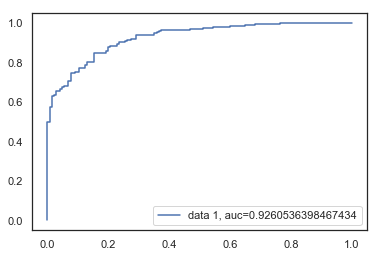

In [177]:
y_pred_proba = lg.predict_proba(X_test_lg)[::,1]
fpr, tpr, _ = sklearn.metrics.roc_curve(y_test_lg,  y_pred_proba)
auc = sklearn.metrics.roc_auc_score(y_test_lg, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Linear Regression Part 1: Uni-variate Regression
- Use uni-variate regression to predict each index for each country
- In the case that a country only has one or two data in a column, the regression model cannot function properly, so fill the predicted data with NA
- use list `preds` to store Year 2019-2023 predicted indexes

In [178]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures

In [179]:
START = 2019
INTERVAL = 5
country = hpData['Country name'].unique()
indexData = hpData.drop(columns='Life Ladder')

# cols = countryData.columns.drop(['Year', 'Life Ladder'])
year = pd.DataFrame({'Year': range(START, START+INTERVAL)})
# year = np.array(range(START, START+INTERVAL))
indexes = []

for each in country:
    each_df = indexData[indexData['Country name'] == each]
    each_l = [[], [], [], [], []]

    if len(each_df) > 1:
#         for col in cols.drop('Country name'):
        for col, corr in dict(each_df.corr()['Year'].drop('Year')).items():
            # abandon NA in predicting indexs for each country
            yr_idx = each_df[['Year', col]].dropna()
            if len(yr_idx) > 2:
                linreg = LinearRegression()
#                 if abs(corr) >= 0.3:     
                linreg.fit(pd.DataFrame(yr_idx['Year']), pd.DataFrame(yr_idx[col]))
                pred = linreg.predict(year)
#                 else:
#                     polyreg = PolynomialFeatures(degree=8)
#                     X_poly = polyreg.fit_transform(pd.DataFrame(yr_idx['Year']))
#                     linreg.fit(X_poly, pd.DataFrame(yr_idx[col]))
#                     pred = linreg.predict(polyreg.fit_transform(year))
#                     y_pred = linreg.predict(X_poly)
                each_l = [each_l[i] + pred.tolist()[i] for i in range(INTERVAL)]
            else:
                for i in range(INTERVAL):
                    each_l[i].append(np.nan)
        indexes.append(each_l)
    else:
        indexes.append([[np.nan] * INTERVAL] * INTERVAL)

In [180]:
# predictions of indexes: preds[i] -> predictions of year (2018 + i)
preds = [pd.concat([pd.DataFrame(country), pd.DataFrame([i[j] for i in indexes])], axis=1) for j in range(INTERVAL)]
cols = hpData.columns.drop(['Life Ladder'])
for i in range(INTERVAL):
    preds[i].columns = cols.drop('Year')
    preds[i] = preds[i].reindex(columns=cols, fill_value=START+i)

In [181]:
# year 2020 predicted indexes
df = preds[1]
df.head()

,Country name,Year,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,2020,7.618325,0.523809,53.705454,0.325713,-0.101899,0.918759
1,Albania,2020,9.455667,0.587334,69.169622,0.851744,-0.011481,0.906419
2,Algeria,2020,9.582147,0.774890,66.217043,0.497954,-0.167411,0.768701
3,Angola,2020,8.865094,0.785644,58.799997,-0.049509,-0.553734,0.625774
4,Argentina,2020,9.878254,0.904726,69.051648,0.889301,-0.197276,0.833040


## Linear Regression Part 2: Multi-variate Regression
- Use all 6 indexes to predict life ladder (happiness) for each country in future 5 years
- We have tried multi-variate linear regression, logistics regression (for classification) and random forest regression
    - And we found that Random Forest Regression is more suitable and accurate due to 1. less deviated points; 2. high R^2 value and low MSE, compared to previous regression methods
- As for those countries with `losses of data of one more columns` (e.g. China with missing column of Perception of Corruption), we cannot use the regression with ALL 6 Determinants, instead, we use the uni-variate linear regression between life ladder and index with the highest correlation with life ladder (draw a heatmap to visulize) 

In [182]:
# predict happiness by using the six indexes

# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

Index(['Log GDP per capita', 'Social support',
       'Healthy life expectancy at birth', 'Freedom to make life choices',
       'Generosity', 'Perceptions of corruption'],
      dtype='object')
Intercept of Regression 	: b =  [-1.8421968]
Coefficients of Regression 	: a =  [[ 0.33345391  2.44040153  0.03004875  1.02387264  0.72030616 -0.53970931]]

                         Predictors  Coefficients
0                Log GDP per capita      0.333454
1                    Social support      2.440402
2  Healthy life expectancy at birth      0.030049
3      Freedom to make life choices      1.023873
4                        Generosity      0.720306
5         Perceptions of corruption     -0.539709



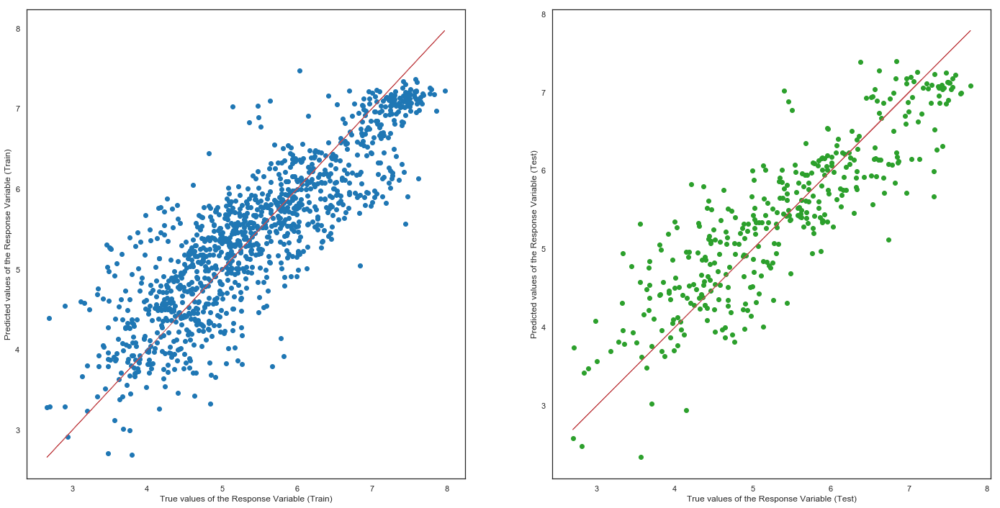

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.7280324224944108
Mean Squared Error (MSE) 	: 0.3423514711009042

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.7564685656381289
Mean Squared Error (MSE) 	: 0.3353044165496488



In [183]:
pureData = hpData.dropna()
cols = pureData.columns.drop(['Country name', 'Year', 'Life Ladder'])
print(cols)
y = pd.DataFrame(pureData['Life Ladder'])
X = pd.DataFrame(pureData[cols])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Linear Regression using Train Data
mullinreg = LinearRegression()         # create the linear regression object
mullinreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', mullinreg.intercept_)
print('Coefficients of Regression \t: a = ', mullinreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, mullinreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

# Predict Response corresponding to Predictors
y_train_pred = mullinreg.predict(X_train)
y_test_pred = mullinreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "#1f77b4") #blue
axes[0].plot(y_train, y_train, 'r-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "#2ca02c") #green
axes[1].plot(y_test, y_test, 'r-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", mullinreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", mullinreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Prediction: Random forest regression
We weren't satisfy with the results of the linear regression so we explored another regression model

/Users/yunfeng/.virtualenvs/plotly3.3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.

/Users/yunfeng/.virtualenvs/plotly3.3/lib/python3.6/site-packages/ipykernel_launcher.py:20: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



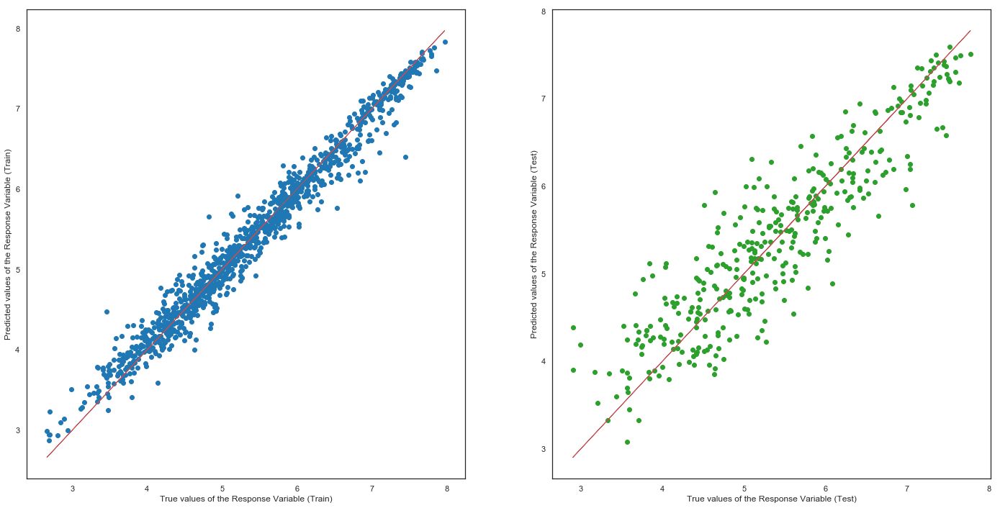

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.971667661920834
Mean Squared Error (MSE) 	: 0.037097805778778685

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.8258355318772271
Mean Squared Error (MSE) 	: 0.21342848322873567
Relative importance of the features:  [0.11546275 0.14054248 0.60124849 0.04814496 0.05151623 0.0430851 ]


In [184]:
# random forest Regression

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble.forest import RandomForestRegressor
from sklearn.metrics import mean_squared_error

pureData = hpData.dropna()
cols = pureData.columns.drop(['Country name', 'Year', 'Life Ladder'])

y = pd.DataFrame(pureData['Life Ladder'])
X = pd.DataFrame(pureData[cols])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Linear Regression using Train Data
rf = RandomForestRegressor()       # create the forest regression object
rf.fit(X_train, y_train) 

y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)
    

    
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "#1f77b4") #blue
axes[0].plot(y_train, y_train, 'r-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "#2ca02c") #green
axes[1].plot(y_test, y_test, 'r-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()    
    
# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", rf.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", rf.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))

print("Relative importance of the features: ",rf.feature_importances_)



In [185]:
# example of exception, using uni-variate regression case
df_chn = hpData[hpData['Country name'] == 'China']
df_chn

,Country name,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
302,China,2006,4.560495,8.765778,0.747011,66.879997,NaN,NaN,NaN
303,China,2007,4.862862,8.893610,0.810852,67.059998,NaN,-0.190670,NaN
304,China,2008,4.846295,8.980649,0.748287,67.239998,0.853072,-0.107168,NaN
305,China,2009,4.454361,9.065514,0.798034,67.419998,0.771143,-0.175440,NaN
306,China,2010,4.652737,9.161761,0.767753,67.599998,0.804794,-0.148574,NaN
307,China,2011,5.037208,9.248056,0.787171,67.760002,0.824162,-0.201896,NaN
308,China,2012,5.094917,9.318813,0.787818,67.919998,0.808255,-0.200405,NaN
309,China,2013,5.241090,9.388591,0.777896,68.080002,0.804724,-0.173715,NaN
310,China,2014,5.195619,9.453964,0.820366,68.239998,NaN,-0.232827,NaN
311,China,2015,5.303878,9.515609,0.793734,68.400002,NaN,-0.260586,NaN


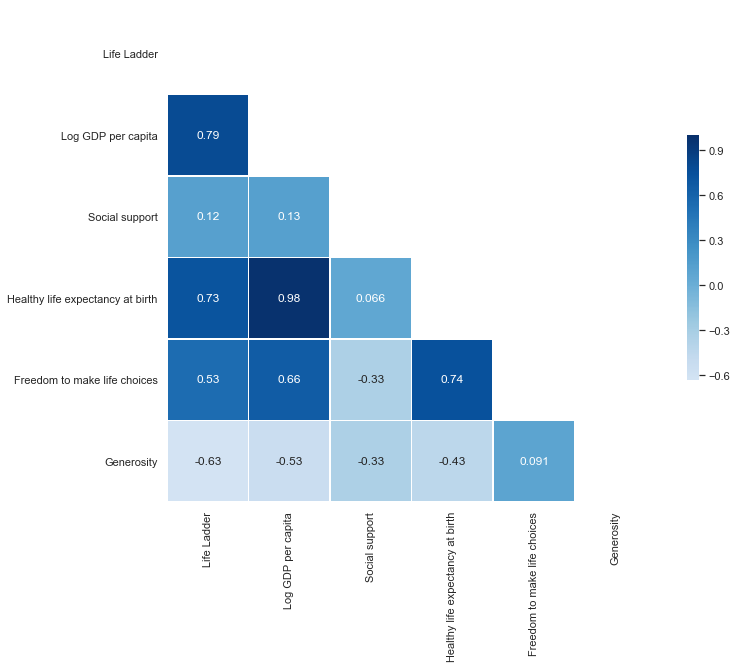

In [186]:
# correlation matrix
corr = df_chn.drop(columns=['Year', 'Perceptions of corruption']).corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))


# Draw the heatmap with the mask and correct aspect ratio
sb.heatmap(corr, mask=mask, vmax=1, center=0, annot=True, cmap="Blues",
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# hence index Log GDP per capita is chosen to predict life ladder by using uni-variate linear regression

In [187]:
country = preds[0]['Country name']
cols = hpData.columns.drop(['Country name', 'Year', 'Life Ladder'])
hap_preds = []
# print(cols)
for i in range(INTERVAL):
    pred = preds[i]
    each_df = []
    for each in country:
        countryDF = hpData[hpData['Country name'] == each]
        # calculate number of NAs in each row
        na_count = pd.DataFrame(pred.shape[1] - pred.count(axis=1))
        na_count = pd.concat([country, na_count], axis=1)
        na_count.columns = ['Country name', '# of NA']
        
        num_na = na_count[na_count['Country name'] == each].values[0][1]
        if num_na != len(cols):
            # if all data are there, i.e. no NA in the row, use the multi-variate linear regression to predict
            indexesDF = countryDF[['Life Ladder'] + list(cols)].dropna()
            #print(each, mullinreg.score(indexesDF[cols], indexesDF['Life Ladder']))
            indexes = pred[pred['Country name'] == each][cols]
            #print(indexes)
            
            if num_na == 0:
                pred_ = rf.predict(indexes)
#                 print(rf.score(indexesDF[cols], indexesDF['Life Ladder']))
                # set up a R^2 standard
                if rf.score(indexesDF[cols], indexesDF['Life Ladder']) > 0.5:
#                     print(each, rf.score(indexesDF[cols], indexesDF['Life Ladder']))
                    each_df.append(pred_[0])
                    continue

            # if some NAs in the row, use uni-variate linear regression to predict the life ladder
            # countryDF = hpData[hpData['Country name'] == each]
            # select the index with highest correlation
            corr = dict(countryDF.corr()['Life Ladder'].drop('Life Ladder'))
            index = max(corr, key=lambda x: abs(corr[x]))

            indexDF = countryDF[['Life Ladder', index]].dropna()
            # set up linear regression model between life ladder and the selected index
            linreg = LinearRegression()
            linreg.fit(pd.DataFrame(indexDF[index]), pd.DataFrame(indexDF['Life Ladder']))
            lin_pred = linreg.predict(pd.DataFrame(pred[pred['Country name'] == each][index]))[0][0]
            if num_na != 0:
                each_df.append(lin_pred)
            else:
                if lin_pred > 2:
                    each_df.append(lin_pred)
                else:
                    each_df.append(pred_[0])
        else:
            # a row full of NA, cannot predict
            each_df.append(np.nan)
            
    hap_preds.append(pd.DataFrame(each_df, columns=['Life Ladder']))

In [188]:
total_preds = [pd.concat([preds[j], hap_preds[j]], axis=1) for j in range(INTERVAL)]

for i in range(INTERVAL):
    total_preds[i] = total_preds[i].reindex(columns=hpData.columns, fill_value=START+i)

In [189]:
df = total_preds[1]
df.head()

,Country name,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,2020,3.497779,7.618325,0.523809,53.705454,0.325713,-0.101899,0.918759
1,Albania,2020,4.619412,9.455667,0.587334,69.169622,0.851744,-0.011481,0.906419
2,Algeria,2020,5.127976,9.582147,0.774890,66.217043,0.497954,-0.167411,0.768701
3,Angola,2020,4.539553,8.865094,0.785644,58.799997,-0.049509,-0.553734,0.625774
4,Argentina,2020,6.142575,9.878254,0.904726,69.051648,0.889301,-0.197276,0.833040


In [190]:
predsWithRegion = []

for pred in total_preds:
    pred = pred.fillna(0)
    pred.index = range(len(preds[0]))
    pred.insert(2, "Region indicator", "-")

    for i in range(len(pred)):
        for j in range(len(regionData)):
            if (pred["Country name"][i] == regionData["country"][j]):
                pred["Region indicator"][i] = regionData["Region indicator"][j]
                break
    predsWithRegion.append(pred)

In [191]:
# 2019-2023 dataset are stored in a list predsWithRegion with length 5
predsWithRegion[0].head()

,Country name,Year,Region indicator,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,2019,South Asia,3.274316,7.592985,0.522732,53.498182,0.354799,-0.073630,0.906930
1,Albania,2019,Central and Eastern Europe,4.671704,9.428395,0.605987,68.899547,0.822470,-0.022964,0.900335
2,Algeria,2019,Middle East and North Africa,5.160397,9.570092,0.780280,66.043250,0.505429,-0.172293,0.754986
3,Angola,2019,Sub-Saharan Africa,4.317819,8.844947,0.779288,58.099998,0.017886,-0.490202,0.657940
4,Argentina,2019,Latin America and Caribbean,6.115550,9.871681,0.904836,68.884615,0.873170,-0.191981,0.834523


In [192]:
# merge the original dataset and predicted dataset into pandas dataframe hpWithPredDataWithRegion 
predsConcat = predsWithRegion[0]
for i in range(1, INTERVAL):
    predsConcat = predsConcat.append(predsWithRegion[i], ignore_index=True)
hpWithPredDataWithRegion = hpDataNoNaWithRegion.append(predsConcat, ignore_index=True)

In [193]:
# re-index dataframe hpWithPredDataWithRegion
hpWithPredDataWithRegion = hpWithPredDataWithRegion.sort_values(['Country name', 'Year'])
hpWithPredDataWithRegion.index = range(len(hpWithPredDataWithRegion))
hpWithPredDataWithRegion.head()

,Country name,Year,Region indicator,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,2008,South Asia,3.723590,7.168690,0.450662,50.799999,0.718114,0.177889,0.881686
1,Afghanistan,2009,South Asia,4.401778,7.333790,0.552308,51.200001,0.678896,0.200178,0.850035
2,Afghanistan,2010,South Asia,4.758381,7.386629,0.539075,51.599998,0.600127,0.134353,0.706766
3,Afghanistan,2011,South Asia,3.831719,7.415019,0.521104,51.919998,0.495901,0.172137,0.731109
4,Afghanistan,2012,South Asia,3.782938,7.517126,0.520637,52.240002,0.530935,0.244273,0.775620


In [194]:
url = 'https://raw.githubusercontent.com/plotly/datasets/master/gapminderDataFiveYear.csv'
#dataset = pd.read_csv(url)
dataset = hpWithPredDataWithRegion[hpWithPredDataWithRegion['Year'] >= 2014]

# Bubble chart of life expectancy v.s. life ladder from 2014 to 2024
years = [str(year) for year in range(2014, 2024)]
continents = regionData["Region indicator"].unique()

# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [30, 80], 'title': 'Healthy life expectancy at birth'}
figure['layout']['yaxis'] = {'title': 'Happiness Score'}
figure['layout']['hovermode'] = 'closest'
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '2005',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}
figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
year = 2005
for continent in continents:
    dataset_by_year = dataset[dataset['Year'] == year]
    dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Region indicator'] == continent]

    data_dict = {
        'x': list(dataset_by_year_and_cont['Healthy life expectancy at birth']),
        'y': list(dataset_by_year_and_cont['Life Ladder']),
        'mode': 'markers',
        'text': list(dataset_by_year_and_cont['Country name']),
        'marker': {
            'sizemode': 'area',
            'sizeref': 0.05,
            'size': list(dataset_by_year_and_cont['Log GDP per capita'])
        },
        'name': continent
    }
    figure['data'].append(data_dict)
    
# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for continent in continents:
        dataset_by_year = dataset[dataset['Year'] == int(year)]
        dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Region indicator'] == continent]

        data_dict = {
            'x': list(dataset_by_year_and_cont['Healthy life expectancy at birth']),
            'y': list(dataset_by_year_and_cont['Life Ladder']),
            'mode': 'markers',
            'text': list(dataset_by_year_and_cont['Country name']),
            'marker': {
                'sizemode': 'area',
                'sizeref': 0.05,
                'size': list(dataset_by_year_and_cont['Log GDP per capita'])
            },
            'name': continent
        }
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': False},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)

    
figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)

In [195]:
#cleaning data to extract the data code
PredallCountry =  hpWithPredDataWithRegion['Country name']
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')
PredcountCode=[]
code = pd.DataFrame(df[['COUNTRY', 'CODE']])
code.head()

for x in PredallCountry:
    temp=code[(code['COUNTRY'] == x) ]
    tmp = list(temp['CODE'])
    if len(tmp) != 0:
        PredcountCode.append(tmp[0])
    else:
        PredcountCode.append(0)

In [196]:
predallcountryFilter = pd.DataFrame(hpWithPredDataWithRegion[:])

predallcountryFilter.insert(1, 'code', PredcountCode)

In [197]:
#insert country code for those country with '0' value
for i in range(len(predallcountryFilter)):
        if (predallcountryFilter["Country name"][i] == "Congo (Brazzaville)"):
            predallcountryFilter["code"][i] = "COD"
        if (predallcountryFilter["Country name"][i] == "Congo (Kinshasa)"):
            predallcountryFilter["code"][i] = "COD"
        if (predallcountryFilter["Country name"][i] == "Gambia"):
            predallcountryFilter["code"][i] = "GMB"
        if (predallcountryFilter["Country name"][i] == "Hong Kong S.A.R. of China"):
            predallcountryFilter["code"][i] = "HKG"
        if (predallcountryFilter["Country name"][i] == "Ivory Coast"):
            predallcountryFilter["code"][i] = "CIV"   
        if (predallcountryFilter["Country name"][i] == "Palestinian Territories"):
            predallcountryFilter["code"][i] = "PSE" 
        if (predallcountryFilter["Country name"][i] == "Somaliland region"):
            predallcountryFilter["code"][i] = "SOM"    
        if (predallcountryFilter["Country name"][i] == "Ivory Coast"):
            predallcountryFilter["code"][i] = "CIV"
        if (predallcountryFilter["Country name"][i] == "Myanmar"):
            predallcountryFilter["code"][i] = "MMR"
        if (predallcountryFilter["Country name"][i] == "South Korea"):
            predallcountryFilter["code"][i] = "KOR"
        if (predallcountryFilter["Country name"][i] == "Taiwan Province of China"):
            predallcountryFilter["code"][i] = "TWN"
        if (predallcountryFilter["Country name"][i] == "North Cyprus"):
            predallcountryFilter["code"][i] = "CYP"

In [198]:
# Worldmap of life ladder from 2014 to 2024
dataset = predallcountryFilter

years = range(2014, 2024)
# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['title'] = 'Happiness Score (or Life Ladder) of Countries by Year'
figure['layout']['height'] = 700
figure['layout']['width'] = 1010
figure['layout']['geo'] = {
    'showland': True,
    'showcountries': True,
    'showocean': True,
    'landcolor': 'rgb(229, 229, 229)',
    'oceancolor': 'rgb(234, 234, 242)',
    'showframe': False,
    'showcoastlines': False,
    'countrywidth': 0.5,
    'projection': {'type': 'equirectangular'} 
}

figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '2005',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': True},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make FIGURE data
year = 2005
dataset_by_year = dataset[dataset['Year'] == year]

data_dict = {
    'type' : 'choropleth',
    'locations': dataset_by_year['code'],
    'z': dataset_by_year['Life Ladder'],
    'colorscale': 'RdBu',
    'marker': {
        'line': {
            'color': 'rgb(180,180,180)',
            'width': 0.5,
        },
    },
    'zmin': 2.5,
    'zmax': 8,
    'text': list(dataset_by_year['Country name']),
    'colorbar': {'title': 'Life Ladder', 'dtick': 0.5,}
}

figure['data'].append(data_dict)

# make FRAME data
for year in years:
    frame = {'data': [], 'name': str(year)}
    
    dataset_by_year = dataset[dataset['Year'] == year]
    
    data_dict = {
        'type' : 'choropleth',
        'locations': dataset_by_year['code'],
        'z': dataset_by_year['Life Ladder'],
        'colorscale': 'RdBu',
        'marker': {
            'line': {
                'color': 'rgb(180,180,180)',
                'width': 0.5
            }
        },
        'zmin': 2.5,
        'zmax': 8,
        'text': list(dataset_by_year['Country name']),
        'colorbar': {'title': 'Life Ladder', 'dtick': 0.5},
    }
    frame['data'].append(data_dict)
    
    figure['frames'].append(frame)
    
    slider_step = {
        'label': year,
        'method': 'animate',
        'args': [[year], {
                'mode': 'immediate',
                'transition': {'duration': 300},
                'frame': {'duration': 300, 'redraw': True}
            }
        ]
     
    }
    sliders_dict['steps'].append(slider_step)

figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)

In [199]:
# Bubble chart of log GDP per capita v.s. life ladder from 2014 to 2024
url = 'https://raw.githubusercontent.com/plotly/datasets/master/gapminderDataFiveYear.csv'
#dataset = pd.read_csv(url)
dataset = hpWithPredDataWithRegion

years = range(2005, 2024)
continents = regionData["Region indicator"].unique()

# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [4, 12], 'title': 'Log GDP per capita'}
figure['layout']['yaxis'] = {'title': 'Happiness Score'}
figure['layout']['hovermode'] = 'closest'
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '2005',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}
figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
year = 2005
for continent in continents:
    dataset_by_year = dataset[dataset['Year'] == year]
    dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Region indicator'] == continent]

    data_dict = {
        'x': list(dataset_by_year_and_cont['Log GDP per capita']),
        'y': list(dataset_by_year_and_cont['Life Ladder']),
        'mode': 'markers',
        'text': list(dataset_by_year_and_cont['Country name']),
        'marker': {
            'sizemode': 'area',
            'sizeref': 0.05,
            'size': list(dataset_by_year_and_cont['Log GDP per capita'])
        },
        'name': continent
    }
    figure['data'].append(data_dict)
    
# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for continent in continents:
        dataset_by_year = dataset[dataset['Year'] == int(year)]
        dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Region indicator'] == continent]

        data_dict = {
            'x': list(dataset_by_year_and_cont['Log GDP per capita']),
            'y': list(dataset_by_year_and_cont['Life Ladder']),
            'mode': 'markers',
            'text': list(dataset_by_year_and_cont['Country name']),
            'marker': {
                'sizemode': 'area',
                'sizeref': 0.05,
                'size': list(dataset_by_year_and_cont['Log GDP per capita'])
            },
            'name': continent
        }
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': False},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)

    
figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)

In [200]:
# Bubble chart of social support v.s. life ladder from 2014 to 2024
url = 'https://raw.githubusercontent.com/plotly/datasets/master/gapminderDataFiveYear.csv'
#dataset = pd.read_csv(url)
dataset = hpWithPredDataWithRegion

years = range(2005, 2024)
continents = regionData["Region indicator"].unique()

# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# fill in most of layout
figure['layout']['xaxis'] = {'range': [0.2, 1], 'title': 'Social Support'}
figure['layout']['yaxis'] = {'title': 'Happiness Score'}
figure['layout']['hovermode'] = 'closest'
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '2005',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}
figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
year = 2005
for continent in continents:
    dataset_by_year = dataset[dataset['Year'] == year]
    dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Region indicator'] == continent]

    data_dict = {
        'x': list(dataset_by_year_and_cont['Social support']),
        'y': list(dataset_by_year_and_cont['Life Ladder']),
        'mode': 'markers',
        'text': list(dataset_by_year_and_cont['Country name']),
        'marker': {
            'sizemode': 'area',
            'sizeref': 0.05,
            'size': list(dataset_by_year_and_cont['Log GDP per capita'])
        },
        'name': continent
    }
    figure['data'].append(data_dict)
    
# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for continent in continents:
        dataset_by_year = dataset[dataset['Year'] == int(year)]
        dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Region indicator'] == continent]

        data_dict = {
            'x': list(dataset_by_year_and_cont['Social support']),
            'y': list(dataset_by_year_and_cont['Life Ladder']),
            'mode': 'markers',
            'text': list(dataset_by_year_and_cont['Country name']),
            'marker': {
                'sizemode': 'area',
                'sizeref': 0.05,
                'size': list(dataset_by_year_and_cont['Log GDP per capita'])
            },
            'name': continent
        }
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': False},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)

    
figure['layout']['sliders'] = [sliders_dict]

py.iplot(figure)